# Download BioMassters Data

In [3]:
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

## Download

### Download data via script

In [2]:
%cd ~/projects/dd-biomassters/pix2pix/
!python datasets/biomassters_downloader.py \
    --phase validation \
    --dataroot ../data \
    --dataset_size 32 \
    --metadata_file ../data/metadata/features_metadata_split_42.csv \
    --random_state 5

/Users/loaner/projects/dd-biomassters/pix2pix
0 163e6988
1 84db2ccd
2 06137b43
3 ecce62ba
4 b6afed20
5 7892d2cb
6 d1e12c6c
7 8d2eff52
8 011909e9
9 96fae87e
10 12b8cf9c
11 254ec31f
12 78016bed
13 d2968ab2
14 b81b6ecb
15 de4a69a3
16 3f3c2a5e
17 2441d664
18 65be5931
19 38aac3a8
20 70fca2ff
21 1f457003
22 5d0271e8
23 f9bb7806
24 f3d40af0
25 3a1e1537
26 4abdf19f
27 58c6c3a8
28 fce419af
29 afa7f357
30 497db42b
31 aeeef805


### Download data via module

In [15]:
%cd ~/projects/dd-biomassters/pix2pix/
from datasets.biomassters_downloader import BioMasstersDownloader

dd = BioMasstersDownloader(
    phase='train', 
    dataroot='../data/', 
    dataset_size=128,
    metadata_file="../data/metadata/features_metadata_split_42.csv", 
    satellite=None,
    chip_is_complete=False, 
    is_imputable_s1=False,
    random_state=None)
dd.run()

/Users/loaner/projects/dd-biomassters/pix2pix
0 1a1f591d
1 5521a4ea
2 b910d1a7
3 eee3ce3a
4 49abd286
5 187cf18b
6 243bad58
7 8baffdbd
8 138bc232
9 2003e1cb
10 10cddd46
11 31c77f10
12 5f5e708d
13 9d73fff0
14 07765e15
15 6dae4dd6
16 9d67ba2e
17 0964800b
18 b4656b97
19 81d8de14
20 a8ca3a71
21 7178cc89
22 7d11f2dd
23 d1ee88dd
24 63ada952
25 e6d173c7
26 26622ebc
27 7f487274
28 cce5812b
29 f5d88b97
30 ee3be0be
31 b6634e26
32 0f709309
33 3ec56f19
34 3ae4288f
35 81a07e36
36 cc143994
37 dcf1ba16
38 c7687b82
39 91f7bc39
40 c31eb34f
41 521e0fe7
42 f42af1ea
43 c3771d47
44 92289d5a
45 f74f7080
46 10b290d1
47 611cfadd
48 46f4332d
49 f90477a3
50 a3107eee
51 a424591f
52 f8c53b5b
53 3ee0afc1
54 94457060
55 ba3e1964
56 07741cb0
57 b5cdf9c5
58 a9f6710d
59 8c05ab2c
60 784f852c
61 f9247436
62 7e15125d
63 d5d2b90d
64 706c5059
65 ebe34a7f
66 a2b204a1
67 1541fb61
68 dc7410db
69 2e24b6aa
70 d6052510
71 cf4c2c78
72 2a131d16
73 91e350b3
74 04b380c7
75 c4b07d8c
76 5af51ce0
77 7b484c9b
78 23af9716
79 42587bf5
80 5

## Load data

In [1]:
%cd ~/projects/dd-biomassters/pix2pix/
from data.biomassters_dataset import BioMasstersDataset

class DatasetOptions():
    def __init__(self):
        self.dataset_mode = 'biomassters'
        self.phase = 'train'
        self.max_dataset_size = 4
        self.input_nc = 16
        self.dataroot = '../data'
        self.metadata_file = '../data/metadata/features_metadata_split_42.csv'
        self.satellite = None
        self.random_state = None

opt = DatasetOptions()
dataset = BioMasstersDataset(opt)
dataset.load()

/Users/loaner/projects/dd-biomassters/pix2pix


/Users/loaner/.pyenv/versions/3.8.15/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Visualize: Multiple chips for a given month

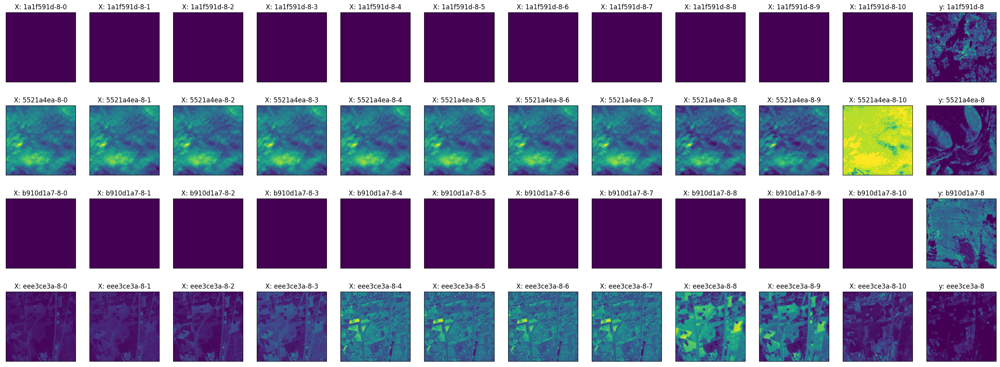

In [4]:
num_images = min(len(dataset.images), 20)
satellite = 2
month = 8
offset, num_channels = (48 + month * 11, 11) if satellite == 2 else (0 + month * 4, 4)

fig, axes = plt.subplots(nrows=num_images, ncols=num_channels+1, figsize=(3*num_channels,3*num_images))
axes = axes.flatten()
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

for i, data in enumerate(dataset.images[:num_images]):
    chip_id, X, y = data.values()
    for ch in range(num_channels):
        idx = i*(num_channels+1) + ch 
        axes[idx].imshow(X[:,:,ch + offset])
        axes[idx].set_title(f'X: {chip_id}-{month}-{ch}')
    axes[idx+1].imshow(y)
    axes[idx+1].set_title(f'y: {chip_id}-{month}')

### Visualize: Single chip across all months and channels

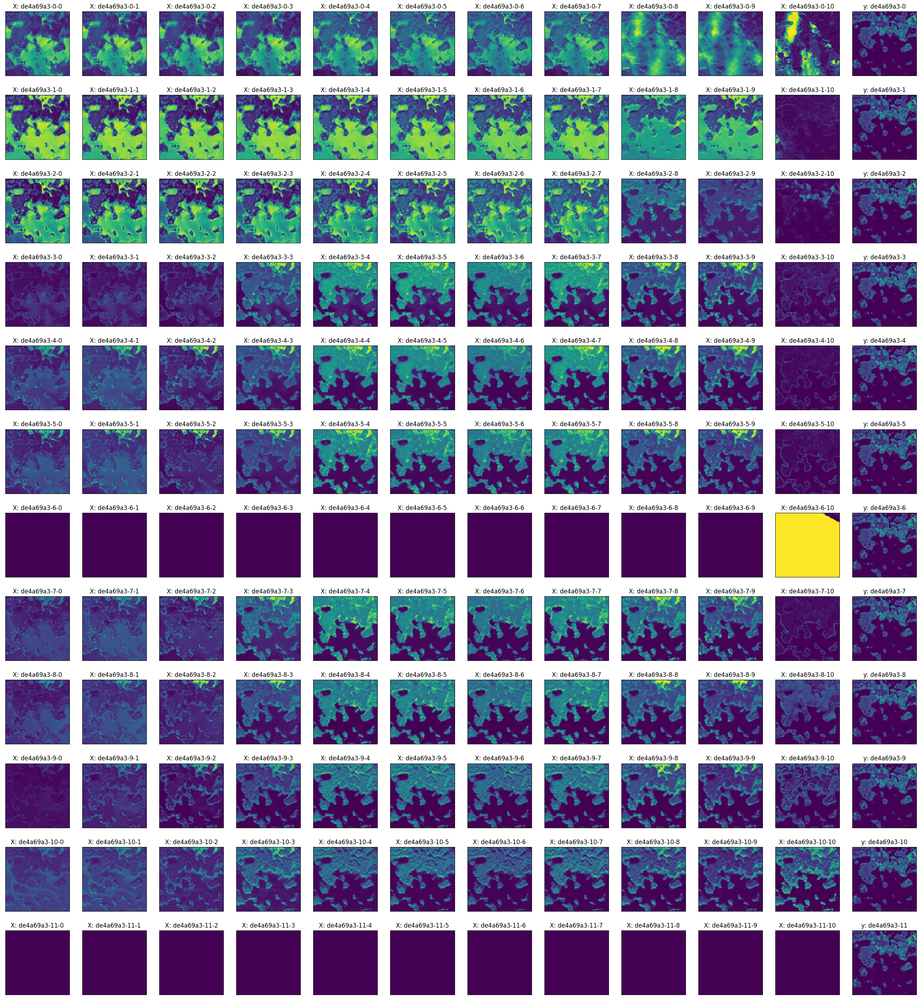

In [8]:
chip = dataset.chips.chip_id.values.tolist()[0]
chip = 'de4a69a3'
chip_data = [data for data in dataset.images if data['chip_id'] == chip][0]
chip_id, X, y = chip_data.values()

num_months = 12
satellite = 2
num_channels = 11 if satellite == 2 else 4

fig, axes = plt.subplots(nrows=num_months, ncols=num_channels+1, figsize=(3*num_channels,3*num_months))
axes = axes.flatten()
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

for month in range(num_months):
    offset = 48 + month * 11 if satellite == 2 else 0 + month * 4
    for ch in range(num_channels):
        idx = month*(num_channels+1) + ch 
        axes[idx].imshow(X[:,:,ch + offset])
        axes[idx].set_title(f'X: {chip_id}-{month}-{ch}')
    axes[idx+1].imshow(y)
    axes[idx+1].set_title(f'y: {chip_id}-{month}')

### Visualize: Pixel count histogram across channels

,channel,min,max,mean,std,median,p99
0,0,0.0,18556.0,1351.633415,2372.984369,242.0,9433.0
1,1,0.0,17831.0,1340.689444,2212.676865,396.0,9215.0
2,2,0.0,17059.0,1336.117304,2271.427543,309.0,9346.0
3,3,0.0,16784.0,1595.071599,2297.934230,727.0,9530.0
4,4,0.0,16621.0,2045.047431,2224.868652,1584.0,9244.0
5,5,0.0,16505.0,2129.546812,2149.115565,1796.0,8849.0
6,6,0.0,16451.0,2251.642187,2249.415536,1935.0,9256.0
7,7,0.0,16182.0,2205.196879,2100.524569,1992.0,8601.0
8,8,0.0,15393.0,849.479930,941.881832,623.0,4136.0
9,9,0.0,15218.0,578.219495,745.588010,405.0,3612.0


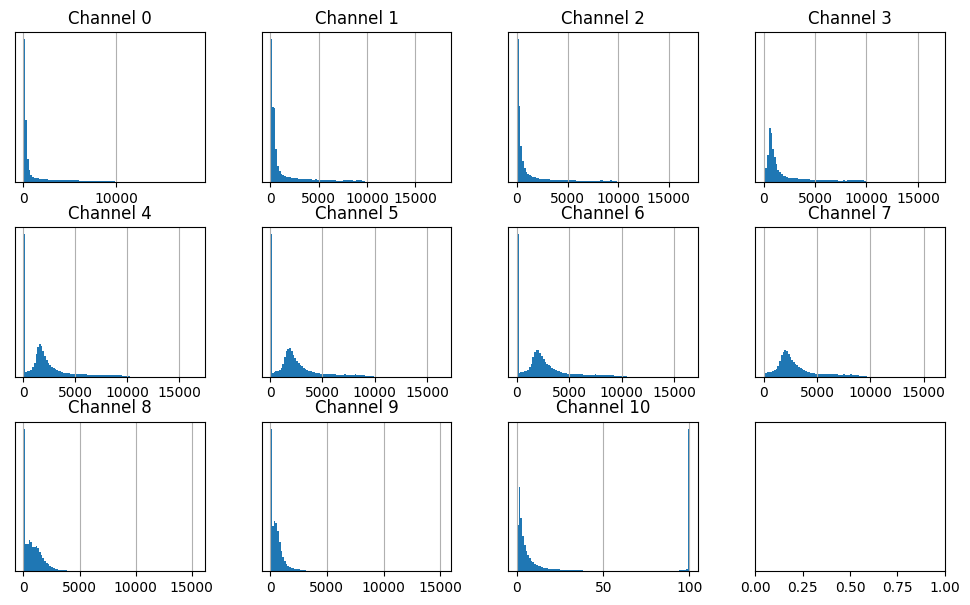

In [21]:
# num_images = min(len(dataset.images), 32)
num_images = len(dataset.images)
satellite = 2

num_months = 12
num_channels = 11 if satellite == 2 else 4

data_channel = {ch:[] for ch in range(num_channels)}
for i, data in enumerate(dataset.images[:num_images]):
    chip_id, X, y = data.values()
    for month in range(num_months):        
        offset = 48 + month * 11 if satellite == 2 else 0 + month * 4
        for ch in range(num_channels):
            data_channel[ch] += [X[:,:,ch + offset].flatten()]

fig, axes = plt.subplots(nrows=3 if satellite == 2 else 1, ncols=4, figsize=(12, 7 if satellite == 2 else 3))
axes = axes.flatten()
for ax in axes:
    # ax.set_xticks([])
    ax.set_yticks([])

data_summary = []
for ch,ax in zip(range(num_channels), axes):
    data_flat = np.concatenate(data_channel[ch])
    title = f'Channel {ch}'
    data_summary += [{
        'channel':ch, 'min':np.nanmin(data_flat), 
        'max':np.nanmax(data_flat), 
        'mean':np.nanmean(data_flat), 
        'std': np.nanstd(data_flat),
        'median':np.nanquantile(data_flat, .5), 
        'p99':np.nanquantile(data_flat, .99)
    }]
    df = pd.DataFrame({title:data_flat})
    df.hist(bins=100, ax=ax)

df = pd.DataFrame(data_summary)
df